In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math

In [52]:
def merge(left, right):
    arr = np.array([])

    # append the smallest element from each array until one is empty
    while len(left) != 0 and len(right) != 0:
        if left[0] > right[0]:
            arr = np.append(arr, right[0])
            right = np.delete(right, 0)
        else:
            arr = np.append(arr, left[0])
            left = np.delete(left, 0)

    # If right is empty, we need to handle rest of left
    while len(left) != 0:
        arr = np.append(arr, left[0])
        left = np.delete(left, 0)

    # If left is empty, we need to handle rest of right
    while len(right) != 0:
        arr = np.append(arr, right[0])
        right = np.delete(right, 0)

    return arr

# recursive mergesort algorithm
def mergesort(a):
    # Sort the values in array ‘a’ and return the sorted array ‘b’.
    n = len(a)

    # base case
    if n == 1:
        return a

    # define some values
    lo = 0
    hi = n - 1
    mid = lo + hi // 2

    # build subarrays
    left = a[lo:mid+1]
    right = a[mid + 1 : hi+1]

    # sort subarrays recursively
    left = mergesort(left)
    right = mergesort(right)

    return merge(left, right)

In [7]:
A = np.array([9,4,5,10])

In [8]:
Q = mergesort(A)
Q

Starting merge
first while loop
second while loop
Starting merge
first while loop
third while loop
Starting merge
first while loop
first while loop
first while loop
third while loop


array([ 4.,  5.,  9., 10.])

In [38]:
N = 4
arrayOfNodes = np.array(range(1,N+1))
newArray = np.split(arrayOfNodes, N)
u = dict(list(enumerate(newArray, start = 1)))
print(u)

{1: array([1]), 2: array([2]), 3: array([3]), 4: array([4])}


In [8]:
N = 4
u = dict(list(enumerate(range(1,N+1), start = 1)))
print(u)

{1: 1, 2: 2, 3: 3, 4: 4}


In [54]:
A = np.array([[0, 8, 0, 3],
                [0, 0, 2, 5],
                [0, 0, 0, 6],
                [0, 0, 0, 0]])
x,y = np.where(A==8)
print(x[0])
print(y[0])

0
1


In [91]:
def makeUnionFind(N):
        # Make one big array of all of the nodes, named 0 to N-1
        arrayOfNodes = np.array(range(N))

        # Split the array into an array of arrays
        newArray = np.split(arrayOfNodes, N)

        # use the new array to make a dictionary,
        # each key is the same number as the single array entry value
        u = dict(list(enumerate(newArray, start=0)))

        # If two nodes are connected, assign the parent to the representative node
        return u

def union(u_in, s1, s2):
        # find the which set is smaller, rename sets for DRY code
        if len(u_in[s1]) <= len(u_in[s2]):
            small = s1
            big = s2
        else:
            small = s2
            big = s1

        # copy elements of smaller set into larger set
        u_in[big] = np.append(u_in[big], u_in[small][0:])

        # change root of all elements in smaller set to root of larger set
        for i in range(len(u_in[small])):
            temp = u_in[small][i]
            u_in[temp][0] = u_in[big][0]

        # change name of smaller to name of larger set
        u_in[small][0] = u_in[big][0]

        # return the updated union-find data structure
        u_out = u_in
        return u_out

def find(u, v):
        s = -1
        # the first element of the array at index v is the name of the root of that set
        s = u.get(v)
        return s[0]
    
def findMinimumSpanningTree(A):
        n = len(A[0])  # number of nodes in A
        T = np.zeros_like(A)  # the Tree to output, initialized to zeros
        u = makeUnionFind(n)

        # make weights into a 1D array and sort the edge weights
        weights = np.array([])
        weights = np.append(weights, A[0:])
        weights = mergesort(weights)

        # Loop through weights, check if added already
        # if added, skip to next weight, if not,
        # union the nodes of that edge and add the edge to T
        i = 0
        numChecked = 0
        numWeights = np.count_nonzero(weights)
        while numChecked <= numWeights:
            w = weights[i]
            node1, node2 = np.where(A == w)
            if w != 0:
                print("u.get(node1)", u.get(node1))
                if find(u, node1) != kruskalClass.find(
                    self, u, node2
                ):
                    T[node1][node2] = w
                    u = union(u, node1, node2)
                    numChecked += 1
            i += 1

        return T

In [92]:
u = makeUnionFind(5)
u

{0: array([0]), 1: array([1]), 2: array([2]), 3: array([3]), 4: array([4])}

In [93]:
q = union(u,1,2)
q

{0: array([0]), 1: array([2]), 2: array([2, 1]), 3: array([3]), 4: array([4])}

In [94]:
type(u.get(2))

numpy.ndarray

In [95]:
type(A[0])

numpy.ndarray

In [96]:
T = findMinimumSpanningTree(A)

TypeError: unhashable type: 'numpy.ndarray'

In [74]:
len(A[0])

4

In [81]:
weights = np.array([])
weights = np.append(weights, A[0:])
weights = mergesort(weights)
int(weights[0])

0

In [87]:
f = find(u, 1)
f

1

# SA #2

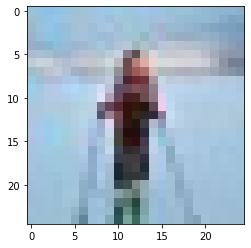

In [7]:
img = plt.imread('Louisfjellet25pixel.jpg')
plt.imshow(img)

In [8]:
img[0][0]

array([153, 196, 213], dtype=uint8)

In [1]:
"""
CSCI 332
Esther Lyon Delsordo
Software Assignment #2
Due December 10, 2022

Implement Ford-Fulkerson Alg and use it to implement the image
segmentation algorithm from Kelinberg-Tardos 7.10

Test script for segmentationClass.py
"""

# Import numpy and pyplot
import numpy as np
import matplotlib.pyplot as plt

# Import my image segmentation class
import segmentationClass

# load a test image FIXME
# I = plt.imread("Louisfjellet25pixel.jpg")

# build test image FIXME
# 3 x 3 with two red pixels, others valued zero
I = np.zeros([3, 3, 3])
I[2, 2, 0] = 128
I[1, 2, 0] = 128

# Make an image segmentation object
# set segmentation object params inline FIXME
sc = segmentationClass.segmentationClass(
    p0=1,  # neigbor penalty
    x_a=np.array([2, 2]),  # Foreground pixel position
    x_b=np.array([0, 0]),  # Background pixel
)

# segment the image
newI = sc.segmentImage(I)

# Plot results
fig, axs = plt.subplots(1, 2)
fig.suptitle("Input and segmentation")
axs[0].imshow(I.astype(np.uint8), interpolation="nearest")
axs[0].set_title("Input image")

# scale 0s and 1s in output image to 0 or 255
axs[1].imshow(255 * np.array(newI).astype(np.uint8), interpolation="nearest", cmap = "Greys")
axs[1].set_title("Binary segmentation")
plt.show()


entering min cut while loop
entering loop where we find the augmenting flow
augmenting_flow 442
entering loop where we find the augmenting flow
augmenting_flow 442
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  0
Gf[curr].capacities[prev][1]:  0
Gf[curr].capacities[prev][1]:  0
Gf[curr].capacities[prev][0]:  442
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  0
Gf[curr].capacities[prev][1]:  0
Gf[curr].capacities[prev][1]:  0
Gf[curr].capacities[prev][0]:  442
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
en

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flow

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flow

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while l

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flow

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flow

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while l

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while l

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flow

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while l

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flow

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while l

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while l

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while l

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flow

entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while l

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flow

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flow

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev

entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while l

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we f

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr

Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev

entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we find the augmenting flow
entering loop where we find the augmenting flow
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering loop where flows are adjusted
Gf[prev].capacities[curr][0]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][1]:  -inf
Gf[curr].capacities[prev][0]:  inf
entering min cut while loop
entering loop where we f


KeyboardInterrupt

